In [1]:
#Pillow library for uploading the image, saving and minor changes
!pip install pillow

In [2]:
from PIL import Image
im_file='Tutorial-HolePunch-02.jpg'
im=Image.open(im_file)
im.show(im_file)
print(im.size)

(1240, 1754)


In [3]:
!pip install opencv-python
!pip install tesseract
!pip install pytesseract

In [4]:
import cv2
import numpy as np
import pytesseract

In [5]:
img_file='Tutorial-HolePunch-02.jpg'
img=cv2.imread(img_file)

In [6]:
# cv2.imshow('windows',img)
# cv2.waitKey(0) #This method won't work in Jupyter Notebooks
import matplotlib.pyplot as plt
def display(im_path):
    dpi = 80 #Dots per inch
    im_data = plt.imread(im_path)

    height, width  = im_data.shape[:2]

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray') #cmap=gray will display the image in grayscale

    plt.show()

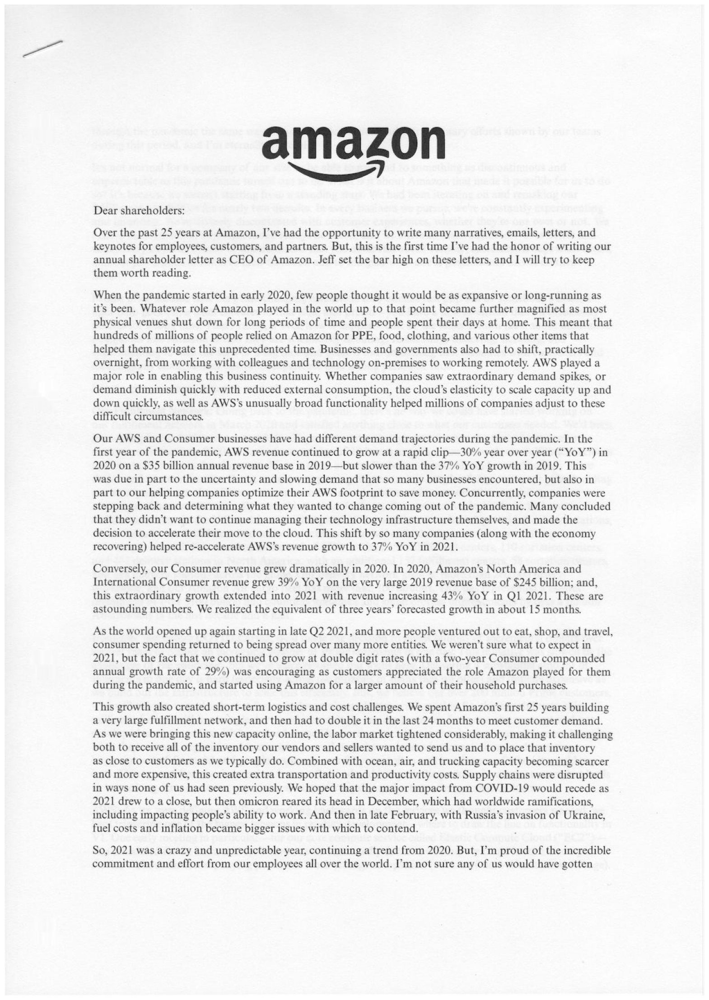

In [7]:
display(im_file)

**INVERTED IMAGES**

In [8]:
inverted_image = cv2.bitwise_not(img) #Flipping each bits
# cv2.imwrite("img_inverted.jpg", inverted_image)
# display('img_inverted.jpg')

In [9]:
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img_rgb[2]=[50,50,255]
# cv2.imwrite("img_RGB.jpg", img_rgb)
# display('img_RGB.jpg')

**BINARIZATION**

In [10]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
gray_image = grayscale(img)
# cv2.imwrite("img_gray.jpg", gray_image)
# display("img_gray.jpg") #Converting image to grayscale so to implement binarization later

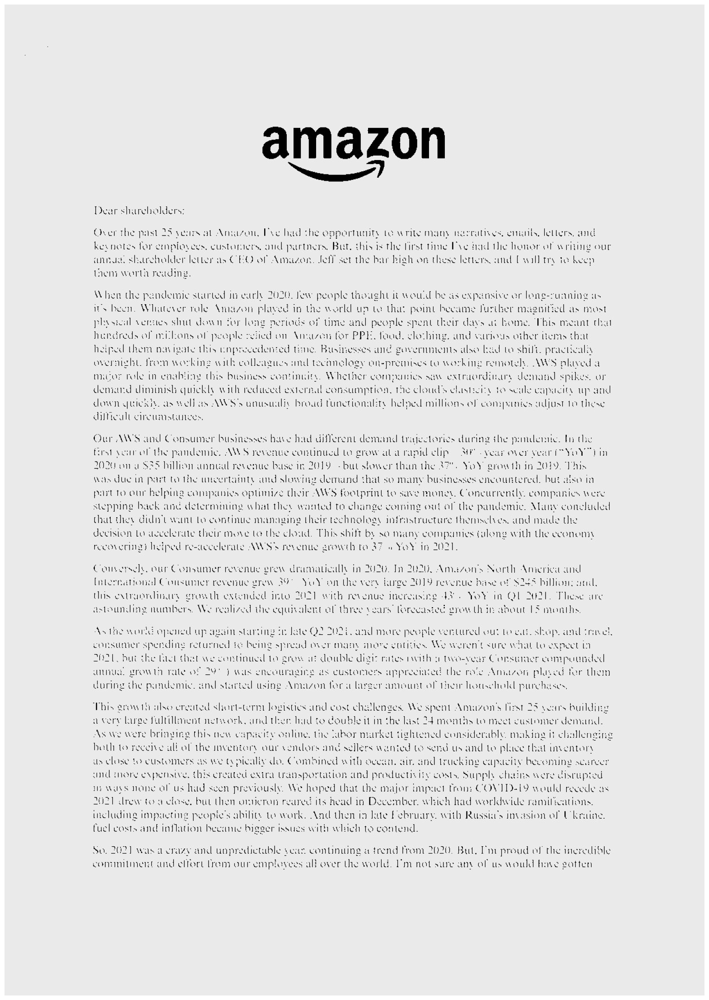

In [11]:
thresh, im_bw_test=cv2.threshold(gray_image, 100, 100 , cv2.THRESH_BINARY)
cv2.imwrite('img_bw_test.jpg', im_bw_test)
display('img_bw_test.jpg')

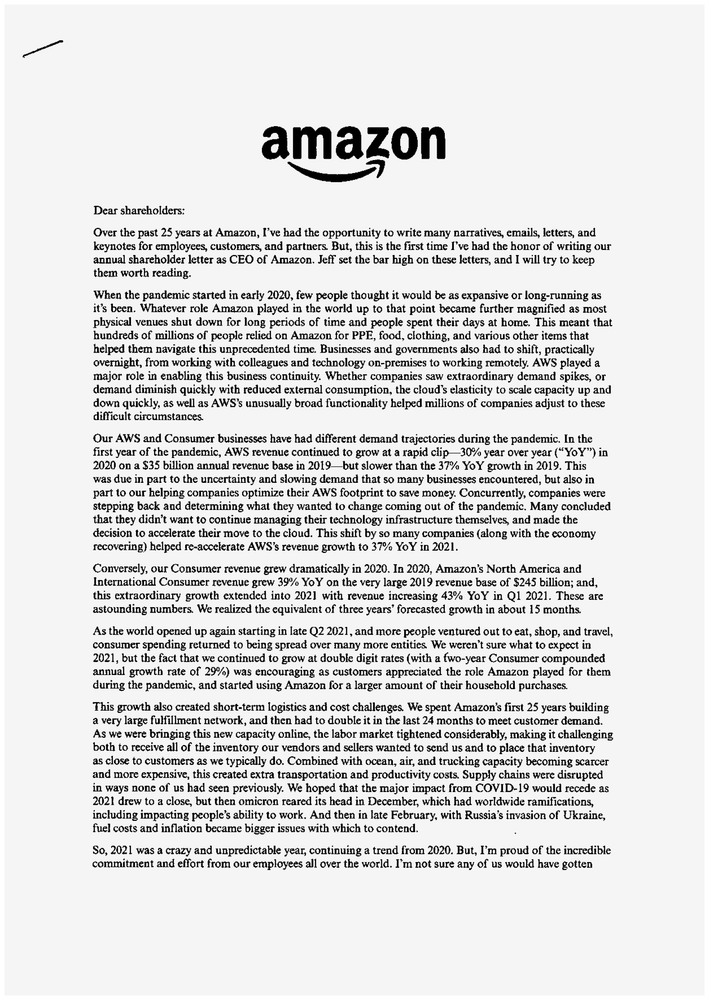

In [12]:
thresh, im_bw=cv2.threshold(gray_image, 200, 230 , cv2.THRESH_BINARY)
cv2.imwrite('img_bw.jpg', im_bw)
display('img_bw.jpg')
# The threshold value used for binarization. In this case, pixels with intensity values below 210 will be set to 0 (black)


**NOISE REMOVAL**

In [13]:
def noise_removal(image):
  kernel=np.ones((1,1), np.uint8)
  image=cv2.dilate(image, kernel, iterations=1)
  kernel=np.ones((1,1), np.int8)
  image=cv2.erode(image, kernel, iterations=1)
  image=cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
  image=cv2.medianBlur(image, 3) #Use this and morph when you'have got noise in the background
  return image

no_noise = noise_removal(im_bw)
# cv2.imwrite("no_noise.jpg", no_noise)
# display("no_noise.jpg")
# Median blur is a non-linear filter that is effective at removing noise while preserving edges in an image.

In [14]:
#Use dilation and erosion to change the fonts with no background noise
def thin_font(image):
  image=cv2.bitwise_not(image)
  kernel=np.ones((2,2), np.uint8)
  cv2.erode(image, kernel, iterations=1)
  image=cv2.bitwise_not(image)
  return image

thin_font = thin_font(no_noise)
# cv2.imwrite("thin_font.jpg", thin_font)
# display("thin_font.jpg")

In [15]:
def thick_font(image):
    import numpy as np
    image = cv2.bitwise_not(image)
    kernel = np.ones((2,2),np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    image = cv2.bitwise_not(image)
    return (image)

dilated_image=thick_font(no_noise)
# cv2.imwrite('dilated_image.jpg',dilated_image)
# display('dilated_image.jpg')

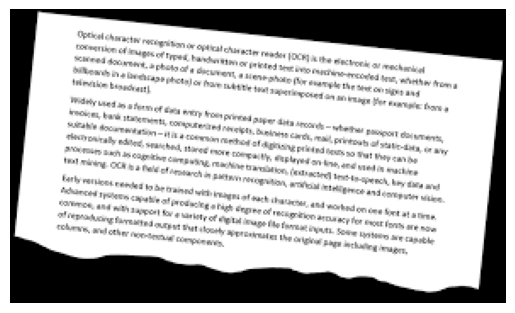

In [18]:
#Rotation
im1=cv2.imread('images (2).png')
plt.imshow(cv2.cvtColor(im1, cv2.COLOR_BGR2RGB)) # Convert color space for proper display with matplotlib
plt.axis('off')
plt.show()


In [19]:
import numpy as np

def getSkewAngle(cvImage) -> float:
    # Prep image, copy, convert to gray scale, blur, and threshold
    newImage = cvImage.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (9, 9), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]

    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30, 5))
    dilate = cv2.dilate(thresh, kernel, iterations=2)

    # Find all contours
    contours, hierarchy = cv2.findContours(dilate, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key = cv2.contourArea, reverse = True)
    for c in contours:
        rect = cv2.boundingRect(c)
        x,y,w,h = rect
        cv2.rectangle(newImage,(x,y),(x+w,y+h),(0,255,0),2)

    # Find largest contour and surround in min area box
    largestContour = contours[0]
    print (len(contours))
    minAreaRect = cv2.minAreaRect(largestContour)
    cv2.imwrite("temp/boxes.jpg", newImage)
    # Determine the angle. Convert it to the value that was originally used to obtain skewed image
    angle = minAreaRect[-1]
    if angle < -45:
        angle = 90 + angle
    return -1.0 * angle
# Rotate the image around its center
def rotateImage(cvImage, angle: float):
    newImage = cvImage.copy()
    (h, w) = newImage.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    newImage = cv2.warpAffine(newImage, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_REPLICATE)
    return newImage

In [20]:
# Deskew image
def deskew(cvImage):
    angle = getSkewAngle(cvImage)
    return rotateImage(cvImage, -1.0 * angle)

In [21]:
fixed = deskew(im1)
# cv2.imwrite("rotated_fixed.jpg", fixed)
# display('rotated_fixed.jpg')

2


In [22]:
#Removing borders
def remove_borders(image):
    contours, heiarchy = cv2.findContours(image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    cntsSorted = sorted(contours, key=lambda x:cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y:y+h, x:x+w]
    return (crop)

In [25]:
no_borders = remove_borders(no_noise)
# cv2.imwrite("no_borders.jpg", no_borders)
# display('no_borders.jpg')

In [26]:
#MISSING BORDERS, YOU SHOULD DO THIS WHEN TEXT IS ALL THE WAY UP BORDERS
#AS MODELS AS TRAINED WITH BORDERS
color=[255,255,255]
top, bottom, left, right=[150]*4
image_with_border=cv2.copyMakeBorder(no_borders,top,bottom,left,right,cv2.BORDER_CONSTANT,value=color)
# cv2.imwrite('with_borders.jpg', image_with_border)
# display('with_borders.jpg')

In [27]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr # Install Tesseract OCR engine
import pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [24]:
ocr_result=pytesseract.image_to_string(img)
# print(ocr_result)

In [28]:
ocr_result=pytesseract.image_to_string(no_noise)
# print(ocr_result)

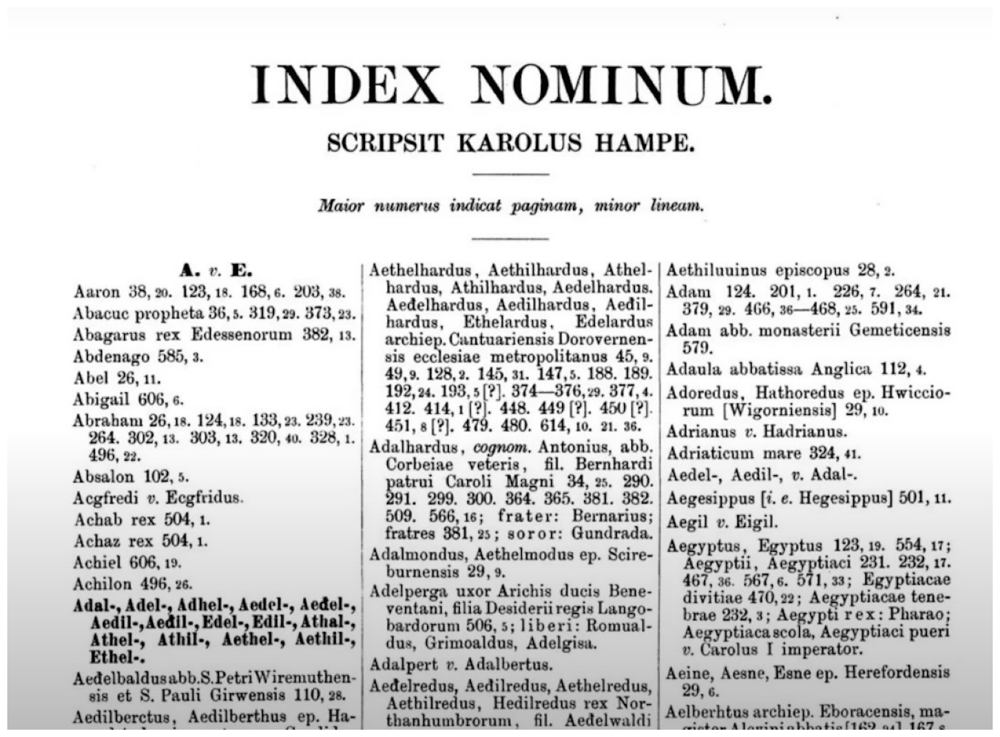

In [29]:
col_image=cv2.imread('Column_separated.jpg')
display('Column_separated.jpg')

In [30]:
# ocr_result=pytesseract.image_to_string(col_image)
# print(ocr_result) #Need to do pre-processing

In [31]:
#Need to extract the columns and the result will be in the sequential order
#We'll use the concept of bounding boxes
gray=cv2.cvtColor(col_image, cv2.COLOR_BGR2GRAY)
# cv2.imwrite('gray.jpg', gray)
# display('gray.jpg')
blur=cv2.GaussianBlur(gray, (9,9), 0)#Doing a blurred effect to identify the structure
# cv2.imwrite('blur.jpg', blur)
# display('blur.jpg')


In [32]:
print(blur.shape)
blur=blur[0:650, 0:1080]
thresh=cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV+cv2.THRESH_OTSU)[-1]
# cv2.imwrite('thresh.jpg', thresh)
# display('thresh.jpg')

(793, 1080)


In [33]:
kernel=cv2.getStructuringElement(cv2.MORPH_RECT, (3,13))
dilate=cv2.dilate(thresh, kernel, iterations=1)#Blurring all the lines to get the structure
# cv2.imwrite('dilate.jpg', dilate)
# display('dilate.jpg')

A. v. E.

Aaron 38, 20. 123, 18. 168, 6. 203, 3s.

Abacuc propheta 36, 5. 319,29. 373, 2.

Abagarus rex Edessenorum 382, 1h.

Abdenago 585, 3.

Abel 26, 11.

Abigail 606, 6.

Abraham 26,18. 124,18. 133, 23, 239, 25.
264. 302,13. 303, 13. 320, 40. 328, |.
496, 22,

Absalon 102, 5.

Acgfredi v. Ecgfridus.

Achab rex 504, 1.

Achaz rex 504,1.

Achiel 606, 19.

Achilon 496, 26.

  

 

 
 
 

Aethelhardus, Aethilhardus, Athel-|| Aethi
hardus, Athilhardus, Aedelhardus.|) 4 dam

Aedelhardus, Aedilhardus, Aedil-|| 379
hardus, Ethelardus, Edelardus|) 4 4,
archiep. Cuntuariensis Dorovernen-|| ‘570

sis ecclesiae metropolitanus 45, 9.
49,9, 128,2. 145, s1, 147,5. 188. 189,|| Adaul

192, 24. 193, 5 [2]. 374376, 19. 377, 4.| Adore
4121 414.1 (2), 448. 449 (2) 4502) |" run
451, 62]. 479. 480. 614, 10. 21. 36. |) sania

Adalhardus, cognom. Antonius, abb. ‘i
Corbeiae 'veteris, fil. Bernhardil] Ad™i®
trui Caroli Magni 34, 25, 290,|) Aedel
Bor. 299. 300. 364. 365, 381. 382.|| Aeges
509. 566,16; frater

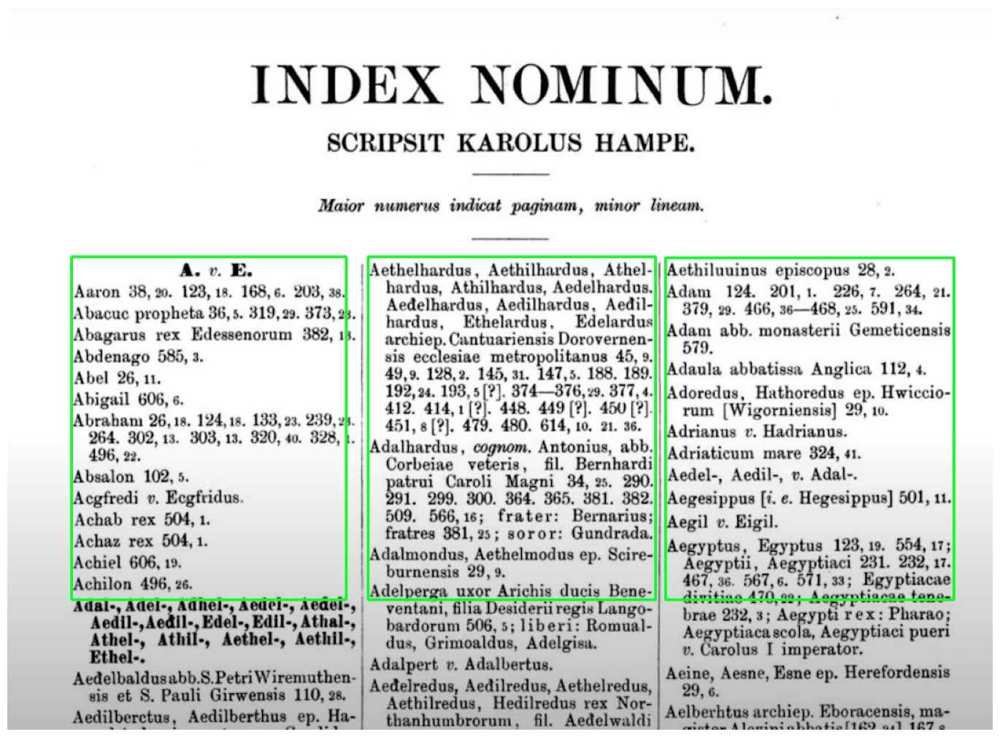

In [34]:
cnts=cv2.findContours(dilate, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
cnts=cnts[0] if len(cnts)==2 else cnts[1]
cnts=sorted(cnts, key=lambda x: cv2.boundingRect(x)[0])
for c in cnts:
  x,y,w,h=cv2.boundingRect(c)
  if h>200 and w>20:
    roi=col_image[y:y+h, x:x+h]
    cv2.rectangle(col_image, (x,y), (x+w, y+h), (36,255,12), 2)
    ocr_result=pytesseract.image_to_string(roi)
    print(ocr_result)
cv2.imwrite('bbox.jpg', col_image)
display('bbox.jpg')